# GFA Pixel Mask

GFA calibrations should normally be updated in the following sequence: zeros, flats, darks, masks.

This notebook should be run using a DESI kernel, e.g. `DESI master`.

In [1]:
%matplotlib inline

In [2]:
import numpy as np
import matplotlib.pyplot as plt

In [3]:
import os
import sys
import json
import collections
from pathlib import Path

In [4]:
import scipy.interpolate
import scipy.stats

In [5]:
import fitsio

Install / upgrade the `desietcimg` package:

In [6]:
try:
    import desietcimg
    print('desietcimg already installed')
except ImportError:
    print('Installing desietcimg...')
    !{sys.executable} -m pip install --user git+https://github.com/dkirkby/desietcimg

desietcimg already installed


In [7]:
upgrade = False
if upgrade:
    print('Upgrading desietcimg...')
    !{sys.executable} -m pip install --upgrade --user git+https://github.com/dkirkby/desietcimg

In [8]:
import desietcimg.util
import desietcimg.plot
import desietcimg.gfa

NERSC configuration:

In [9]:
assert os.getenv('NERSC_HOST', False)

In [10]:
ROOT = Path('/project/projectdirs/desi/spectro/data/')
assert ROOT.exists()

Initial GFA calibration:

In [11]:
CALIB = Path('/global/cscratch1/sd/dkirkby/GFA_calib.fits')
assert CALIB.exists()

Directory for saving plots:

In [12]:
plotdir = Path('maskcal')
plotdir.mkdir(exist_ok=True)

## Pull Statistics

Calculate the pulls for each pixel $(i,j)$ in each exposure $k$ and sum them to calculate a $\chi^2$ statistic for each pixel:
$$
\chi^2_{ij} = \frac{1}{2 \sigma_{ij}^2}\,\left[
\sum_k \left(x_{ijk} - \mu_{ij}\right)^2 - \left(\max_k x_{ijk} - \mu_{ij}\right)^2\right]
$$
where $\mu_{ij}$ is the sample mean over exposures:
$$
\mu_{ij} \equiv \frac{1}{N_\text{exp} - 1} \left[ \sum_k x_{ijk} - \max_k x_{ijk} \right]
$$
and $\sigma^2_{ij}$ is the predicted variance using the measured readnoise $\sigma_0$ and gain $g$:
$$
\sigma^2_{ij} = \mu_{ij} + g^2 \sigma_0^2 \;.
$$
We subtract the maximum observed value in each pixel from $\mu_{ij}$ and $\chi^2_{ij}$ in order to remove the effects of any cosmics,  assuming that the expected rate of cosmics in a given pixel is $\ll 1 / N_\text{exp}$.

We do not expect a perfect $\chi^2$ distribution for "good" pixels since the predicted variance neglects pixel variations in the gain and any fluctuations in the illumination or dark current during the exposure sequence.  However, this is still a useful diagnostic for identify "bad" pixels with very unlikely $\chi^2$ values.

In [13]:
maskinfo = {}

In [14]:
def get_pixel_pvalues(night, first, last, save=str(plotdir / 'pvalue_{night}_{first}.png')):
    pvalue = {}
    files = desietcimg.util.find_files(
        ROOT / str(night) / '{N}/gfa-{N}.fits.fz', min=first, max=last,
        partial_match_is_error=False)
    nexp = len(files)
    print('Processing {0} exposures from {1}...'.format(nexp, night))
    GFA = desietcimg.gfa.GFACamera(calib_name=str(CALIB))
    fig, axes = plt.subplots(5, 2, sharex=True, figsize=(18, 11))
    bins = np.linspace(0, 1, 501)
    for k, gfa in enumerate(GFA.gfa_names):
        ax = axes[k // 2, k % 2]
        # Load data.
        raw, meta = desietcimg.util.load_raw(files, 'EXPTIME', hdu=gfa)
        # Check that all exposures have the same length.
        texp = meta['EXPTIME'][0]
        assert np.all(meta['EXPTIME'] == texp)
        if k == 0:
            print('Exposure time is {0:.1f}s'.format(texp))
        # Subtract bias and convert to elec.
        GFA.setraw(raw, name=gfa)
        # Find the largest value in each pixel over the exposures.
        # We assume that at most one exposure contains a cosmic for each pixel,
        # so by only considering the n-1 remaining exposures we can evaluate
        # the Gaussianity of the exposure to exposure variations in each pixel.
        nexpm1 = GFA.nexp - 1
        maxval = np.max(GFA.data, axis=0)
        # Calculate the the mean of each pixel, excluding the largest value.
        mu = (np.sum(GFA.data, axis=0) - maxval) / nexpm1
        # Calculate the expected Poisson variance of each pixel.
        var = np.maximum(mu, 0)
        # Add the read noise for each amplifier, converted to electrons.
        for amp in GFA.amp_names:
            Q = GFA.quad[amp][1:]
            calib = GFA.calib_data[gfa][amp]
            var[Q] += (calib['RDNOISE'] * calib['GAIN']) ** 2
        assert np.all(var > 0)
        # Calculate pulls.
        pull = (GFA.data - mu) / np.sqrt(var)
        # Calculate the chisq over exposures for each pixel.
        chisq = np.sum(pull ** 2, axis=0)
        # Subtract the contribution of the maximum value in each pixel.
        chisq -= (maxval - mu) ** 2 / var
        assert np.all(chisq >= 0)
        # Calculate pvalues.
        pvalue[gfa] = 1 - scipy.stats.chi2.cdf(chisq, nexpm1)
        # Plot histogram of pvalues.
        ax.hist(pvalue[gfa].reshape(-1), bins=bins, histtype='stepfilled', label=gfa)
        if k in (8, 9):
            ax.set_xlabel('Pixel  $\chi^2$ Probability')
            ax.set_xlim(-0.02, 1.02)
        ax.legend(loc='upper center')
        ax.set_yticks([])
    plt.tight_layout()
    if save:
        plt.savefig(save.format(night=night, first=first))        
    if first in maskinfo:
        print('Replacing previous results')
    maskinfo[first] = dict(night=night, last=last, nexp=nexp, texp=texp, pvalue=pvalue)

Analyze dome dark sequences from different nights to study the stability of bad pixels:

Processing 200 exposures from 20191105...
Exposure time is 5.0s
CPU times: user 2min 4s, sys: 35 s, total: 2min 39s
Wall time: 3min 42s


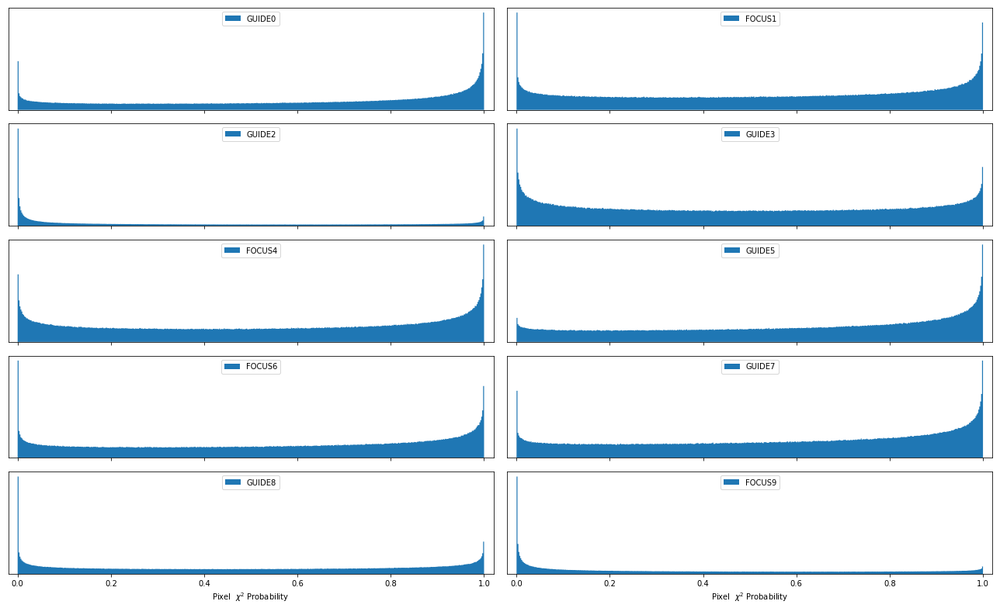

In [15]:
%time get_pixel_pvalues(20191105, 24514, 24713)

Processing 100 exposures from 20191109...
Exposure time is 5.0s


CPU times: user 1min 6s, sys: 16.2 s, total: 1min 22s
Wall time: 2min 22s


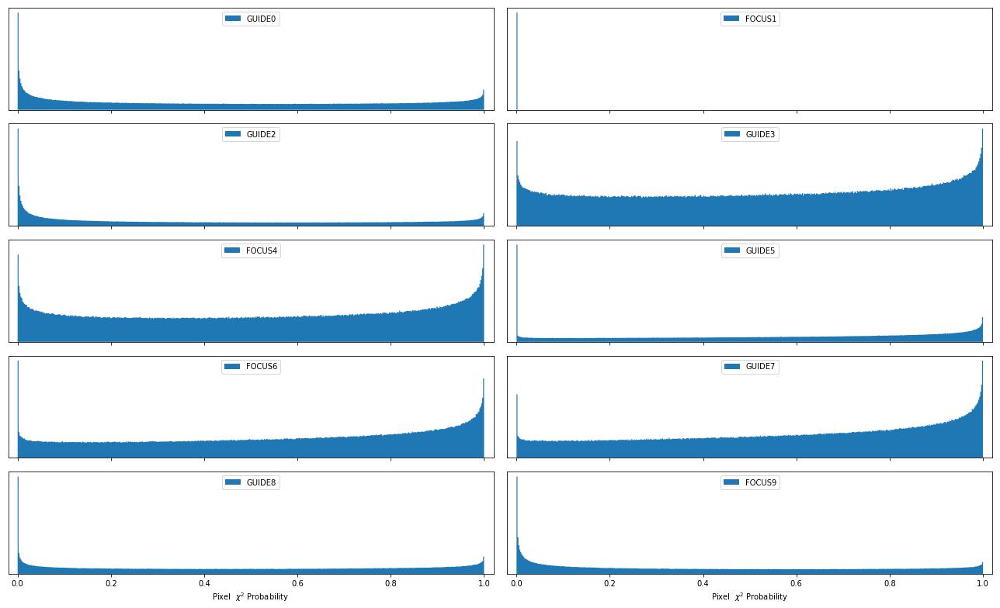

In [16]:
%time get_pixel_pvalues(20191109, 25838, 25937)

Processing 100 exposures from 20191110...
Exposure time is 10.0s
CPU times: user 1min 7s, sys: 16.2 s, total: 1min 23s
Wall time: 1min 57s


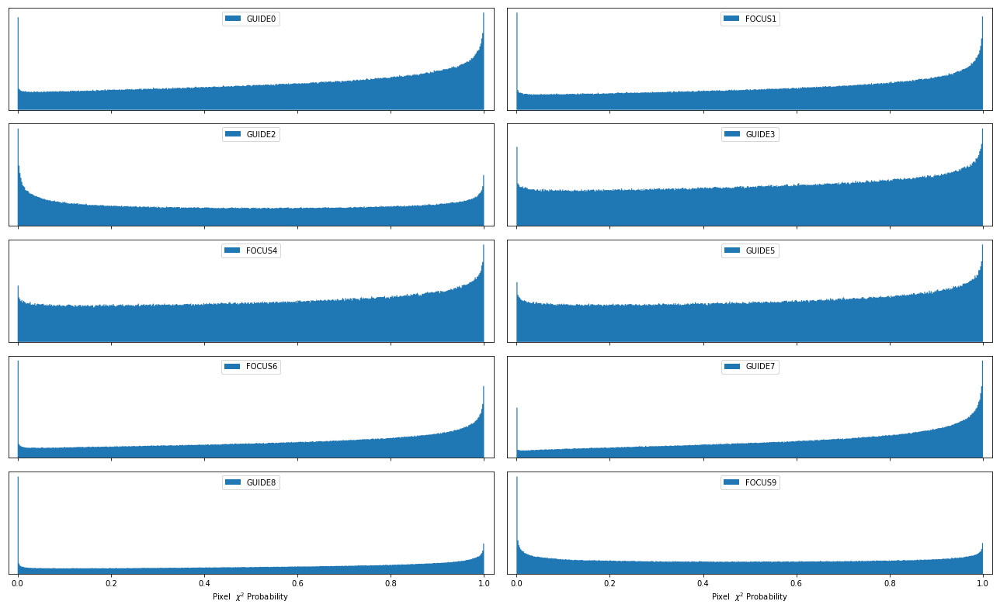

In [17]:
%time get_pixel_pvalues(20191110, 26293, 26393)

Processing 100 exposures from 20191115...
Exposure time is 5.0s


CPU times: user 1min 6s, sys: 16 s, total: 1min 21s
Wall time: 3min 3s


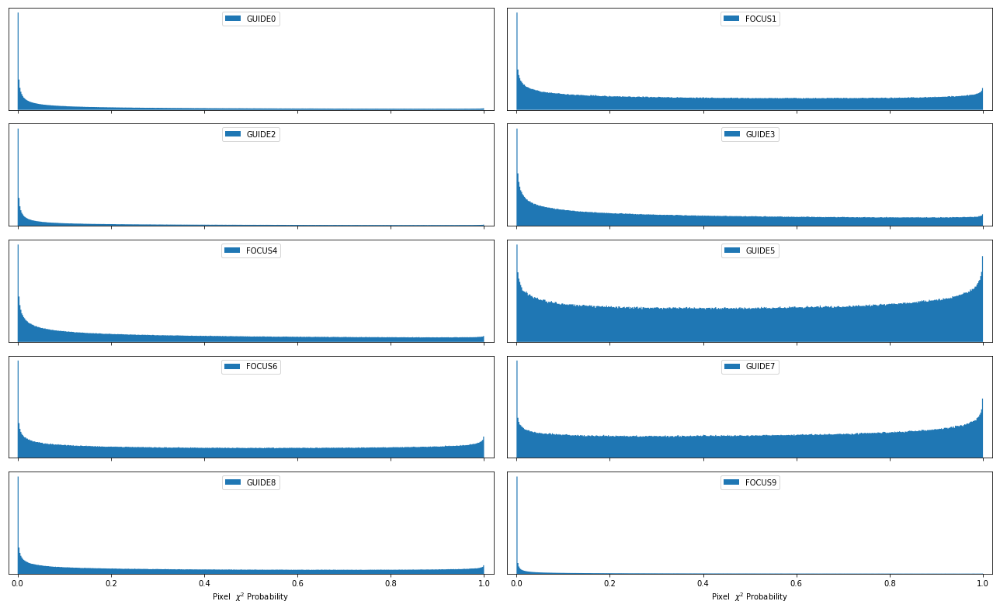

In [18]:
%time get_pixel_pvalues(20191115, 28420, 28519)

## Bad pixel locations and persistence

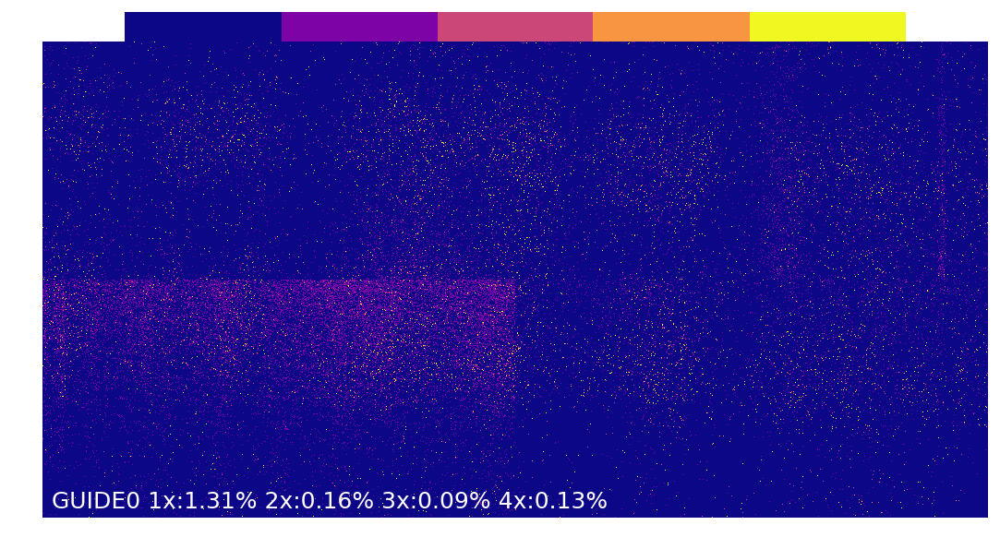

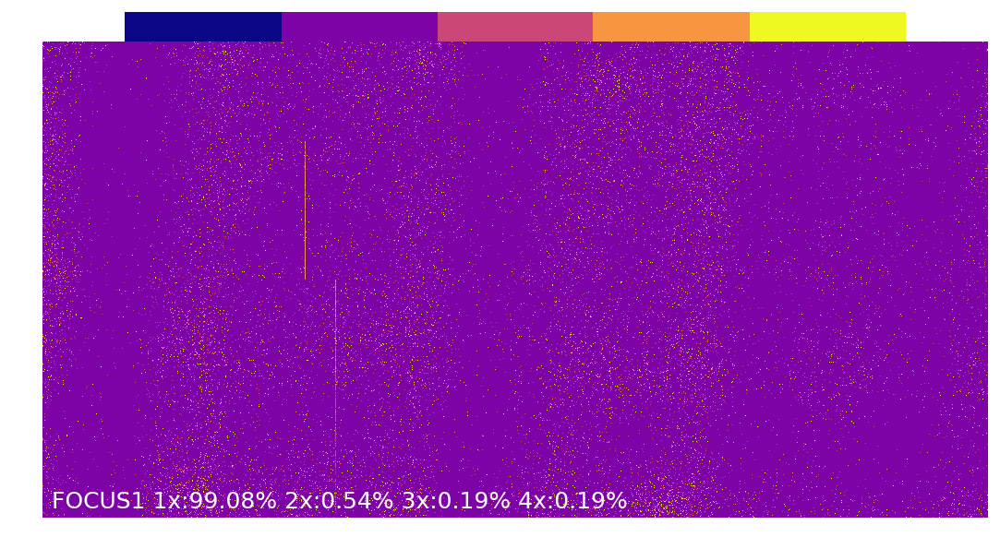

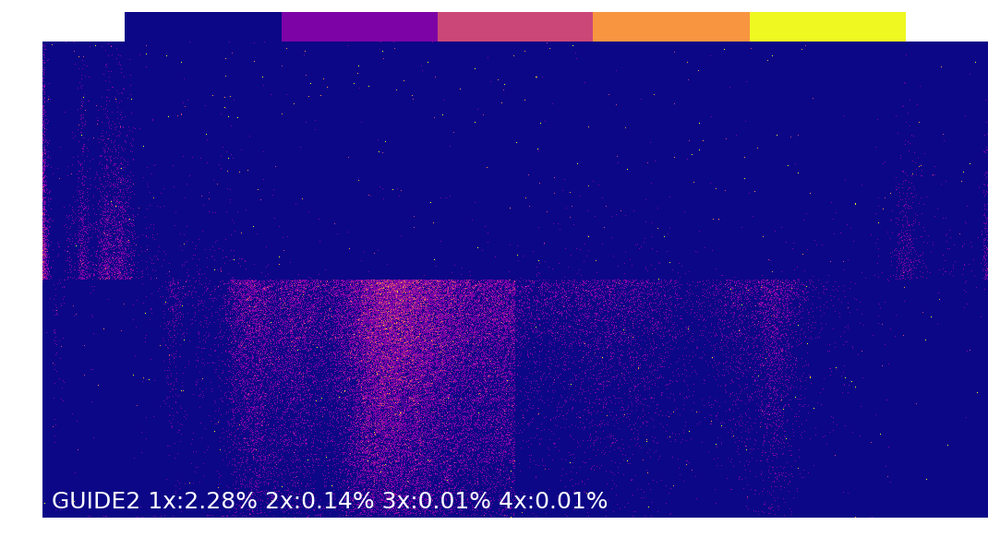

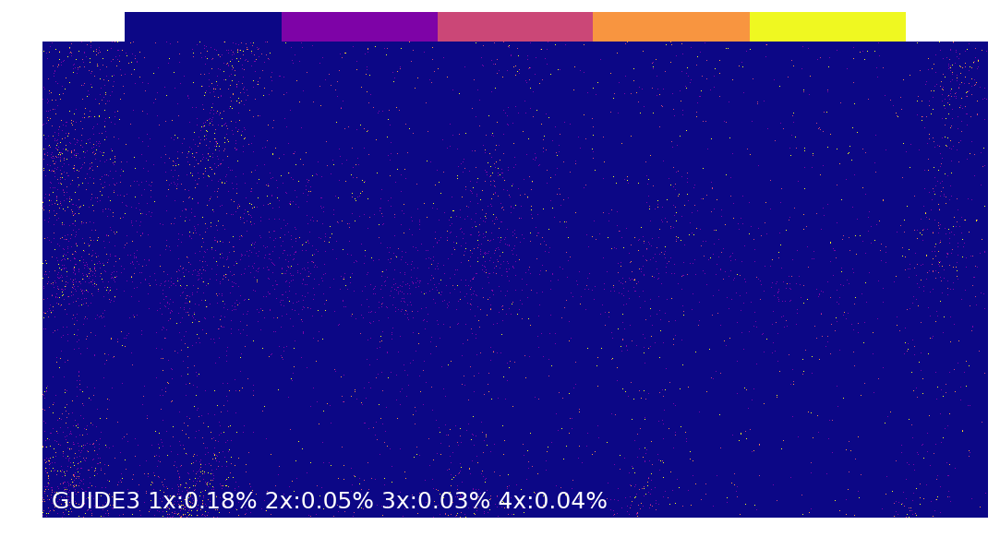

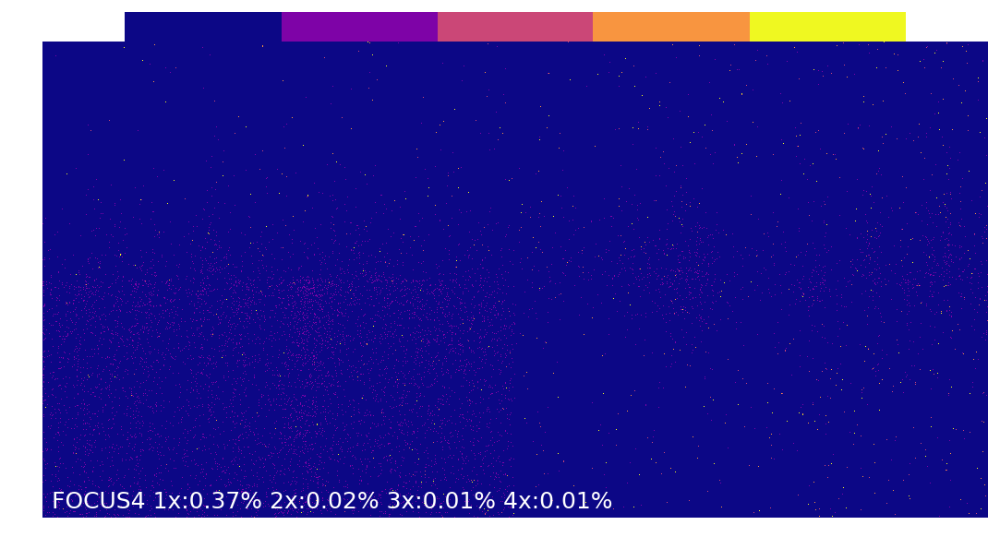

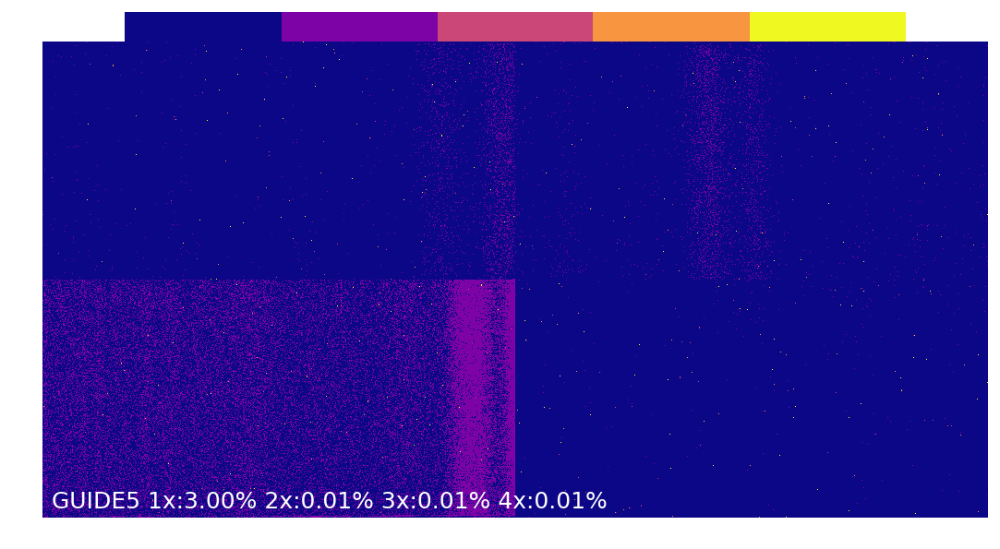

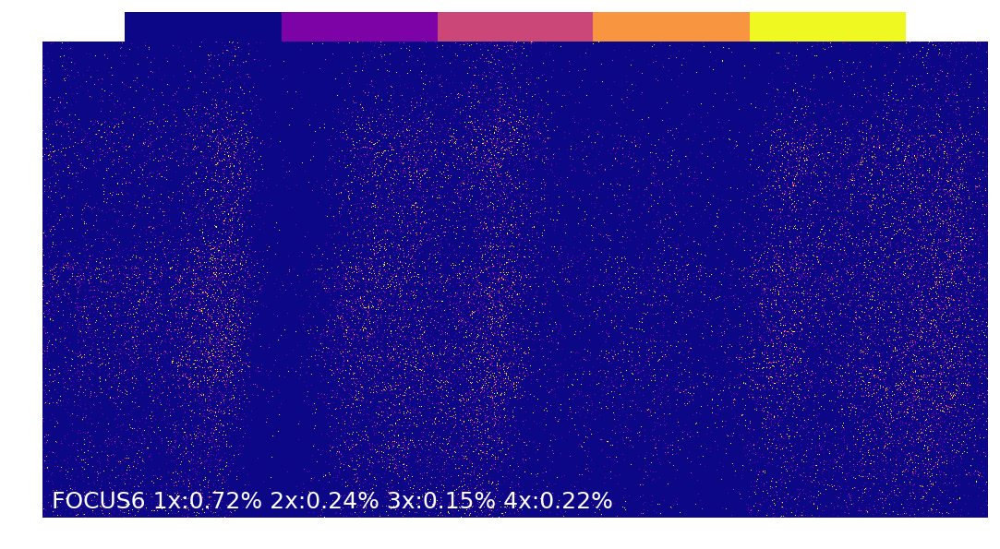

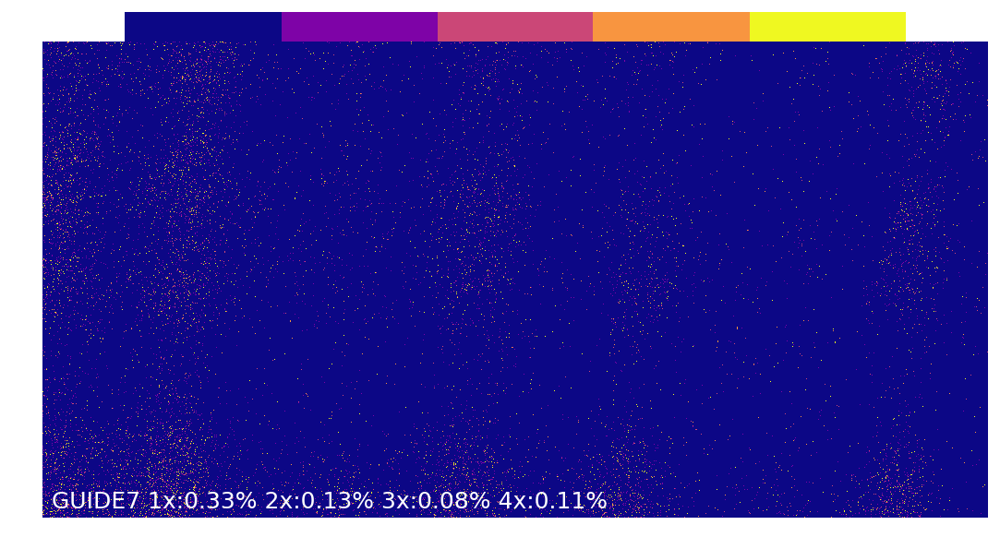

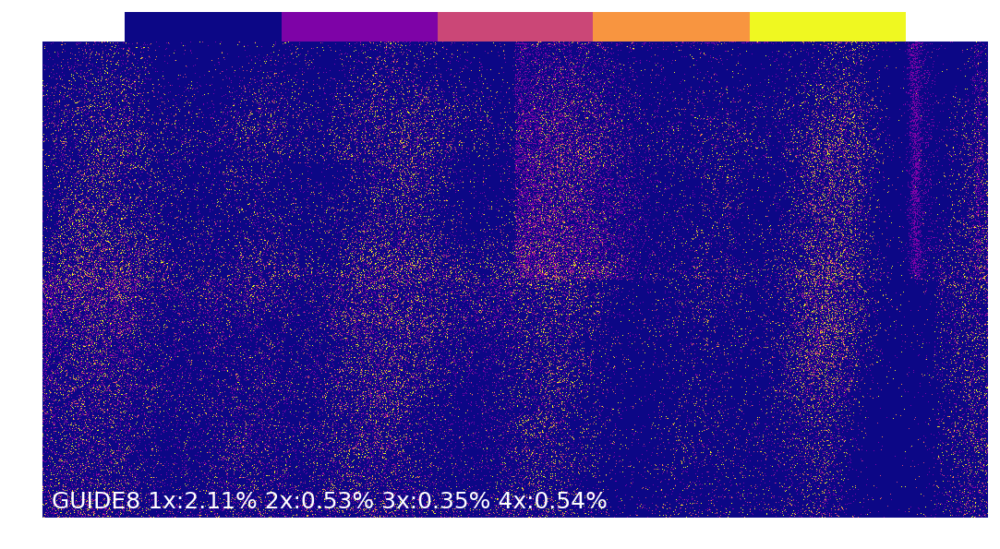

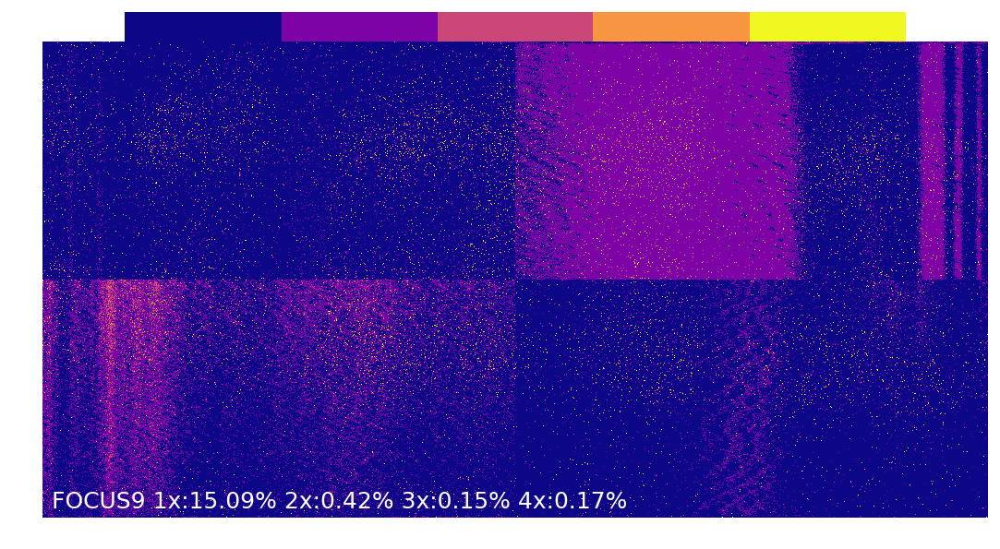

In [19]:
def plot_masks(downsampling=2, pcut=1e-5, save=str(plotdir / 'mask_{gfa}.png')):
    
    ny, nx = 2 * 516, 2 * 1024
    nseq = len(maskinfo)
    cmap = plt.cm.get_cmap('plasma', nseq + 1)
    for gfa in desietcimg.gfa.GFACamera.gfa_names:
        count = np.zeros((ny, nx))
        for first, data in maskinfo.items():
            count += data['pvalue'][gfa] < pcut
        # Downsample taking the max count in each block.
        maxcount = desietcimg.util.downsample(count, downsampling=downsampling, summary=np.max)
        label = gfa
        for n in range(1, nseq + 1):
            npix = np.count_nonzero(count == n)
            label += ' {0}x:{1:.2f}%'.format(n, 100 * npix / (ny * nx))
        desietcimg.plot.plot_pixels(
            maxcount, label=label, colorhist=True, imshow_args=dict(cmap=cmap, vmin=-0.5, vmax=nseq + 0.5))
        if save:
            plt.savefig(save.format(gfa=gfa))
        plt.show()

plot_masks()

## Bad Pixel Temporal Structure

Plot the raw values across all sequences for some (randomly chosen) pixels that are identified as bad in a specified number of sequences:

In [39]:
def plot_timeseries(gfa, npix=8, nbadseq=3, pcut=1e-5, seed=123, save=None):
    
    rng = np.random.RandomState(seed)
    GFA = desietcimg.gfa.GFACamera(calib_name=str(CALIB))
    ny, nx = 2 * GFA.nampy, 2 * GFA.nampx
    count = np.zeros((ny, nx))
    nseq = len(maskinfo)
    for first, data in maskinfo.items():
        count += data['pvalue'][gfa] < pcut
    # Find all pixels that are bad in nbadseq sequences.
    idx = np.where((count == nbadseq).reshape(-1))[0]
    # Pick a random subset to plot.
    idx = rng.choice(idx, size=npix, replace=False)
    nexptot = 0    
    fig, ax = plt.subplots(npix, 1, sharex=True, figsize=(10, 2 * npix))    
    # Loop over sequences in order of increasing night.
    forder = sorted(maskinfo.keys(), key=lambda F: maskinfo[F]['night'])    
    for first in forder:
        data = maskinfo[first]
        # Locate the sequence files.
        files = desietcimg.util.find_files(
            ROOT / str(data['night']) / '{N}/gfa-{N}.fits.fz', min=first, max=data['last'],
            partial_match_is_error=False)
        nexp = len(files)
        x = np.arange(nexptot, nexptot + nexp)
        # Load the raw data for this sequence.
        raw, _ = desietcimg.util.load_raw(files, hdu=gfa)
        # Calculate the overscan bias and remove overscan regions but do not apply any corrections.
        GFA.setraw(raw, name=gfa, overscan_correction=False, subtract_master_zero=False, apply_gain=False)
        # Loop over pixels to plot.
        for k, ixy in enumerate(idx):
            iy, ix = np.unravel_index(ixy, (ny, nx))
            pvalue = data['pvalue'][gfa][iy, ix]
            # Lookup the raw data for this pixel.
            y = GFA.data[:, iy, ix]
            # Lookup the overscan bias in each exposure for this pixel.
            if iy < GFA.nampy:
                amp = 'E' if ix < GFA.nampx else 'F'
            else:
                amp = 'H' if ix < GFA.nampx else 'G'
            bias = GFA.bias[amp]
            # Add the master zero bias value for this pixel.
            bias += GFA.master_zero[gfa][iy, ix]
            # Convert from physical to raw pixel coords.
            ix += (GFA.nscan if ix < GFA.nampx else 3 * GFA.nscan)
            # Extract the raw data for this sequence.
            y2 = raw[:, iy, ix].astype(np.float32)
            assert(np.array_equal(y, y2))
            # Remove the maximum raw value, which is probably the same exposure that was
            # excluded from the pvalue calculation (although that was based on calibrated values.)
            y[np.argmax(y)] = np.nan
            label = 'p={0:.2g}'.format(pvalue)
            ax[k].plot(x, y, '.', label=label)
            ax[k].set_ylabel('{0}[{1},{2}]'.format(gfa, iy, ix))
            ax[k].plot(x, bias, 'k-', alpha=0.5)
        nexptot += nexp
    for k in range(npix):
        #ax[k].plot([], [], 'k-', label='bias')
        ax[k].legend(ncol=nseq // 2)
    ax[-1].set_xlabel('Exposure Number')
    plt.tight_layout()
    if save:
        plt.savefig(save)

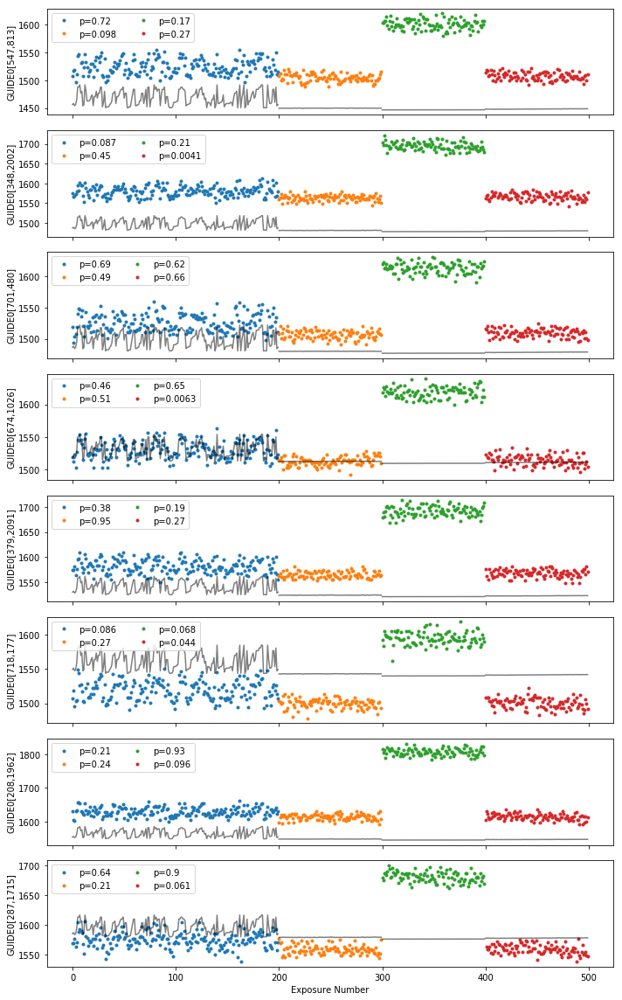

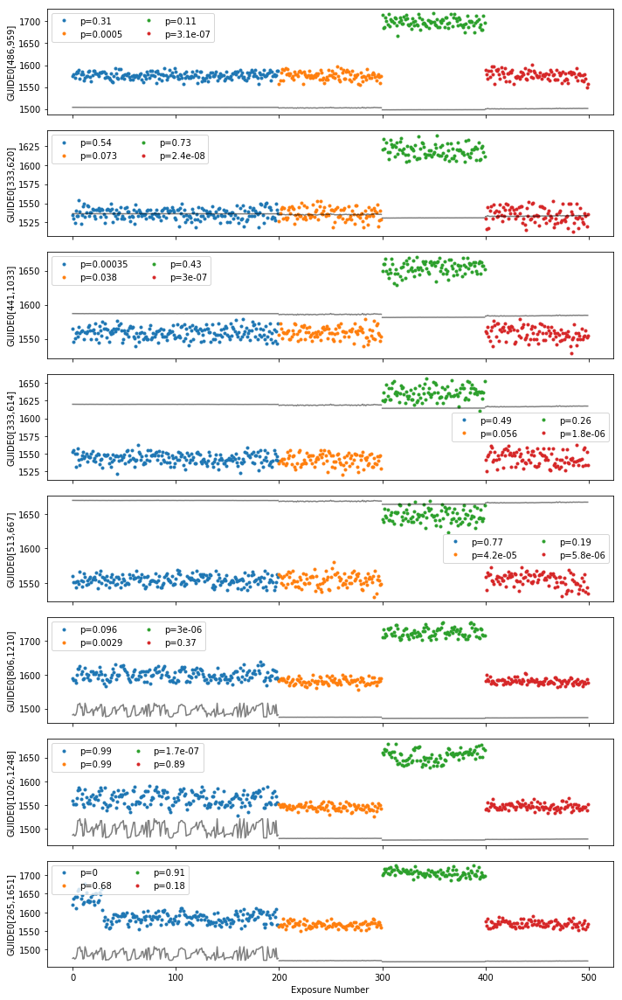

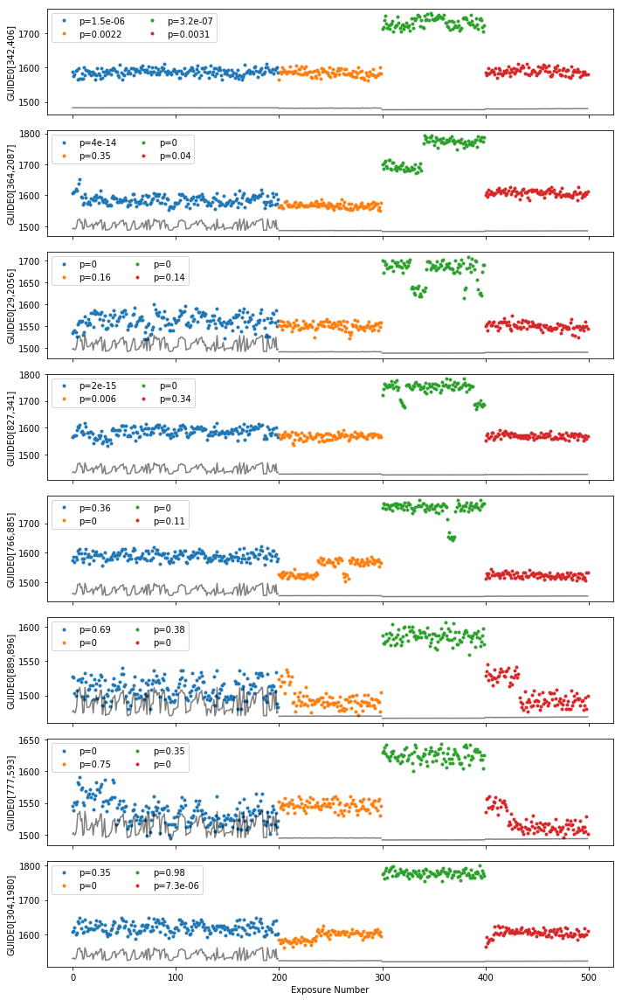

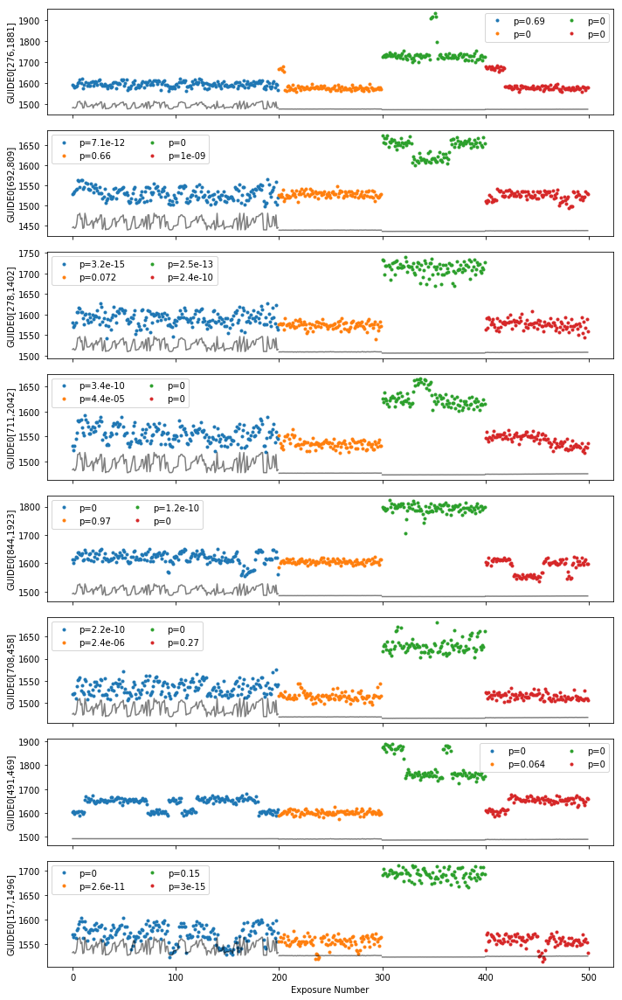

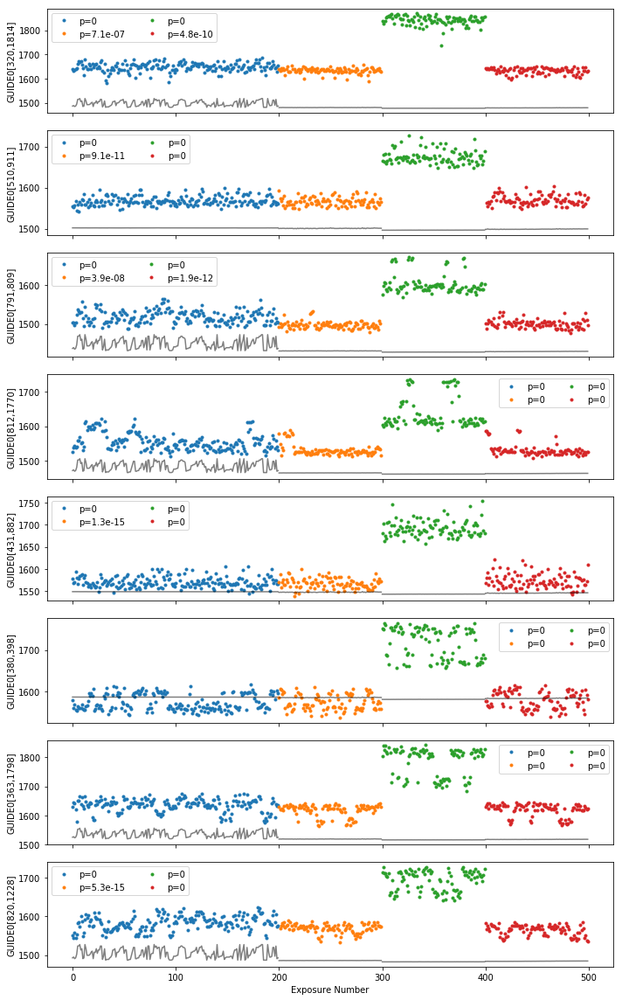

...

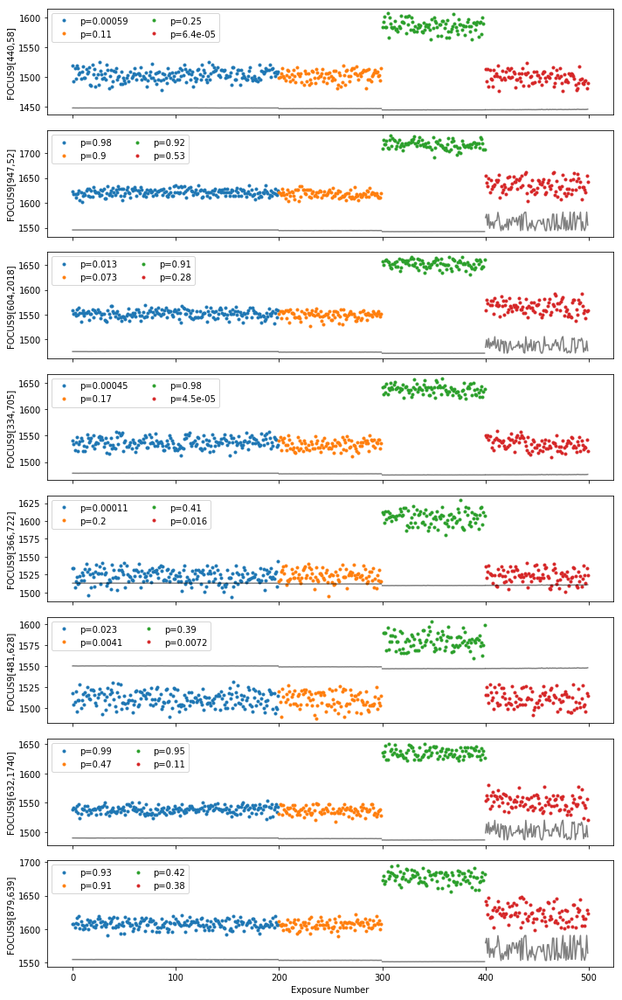

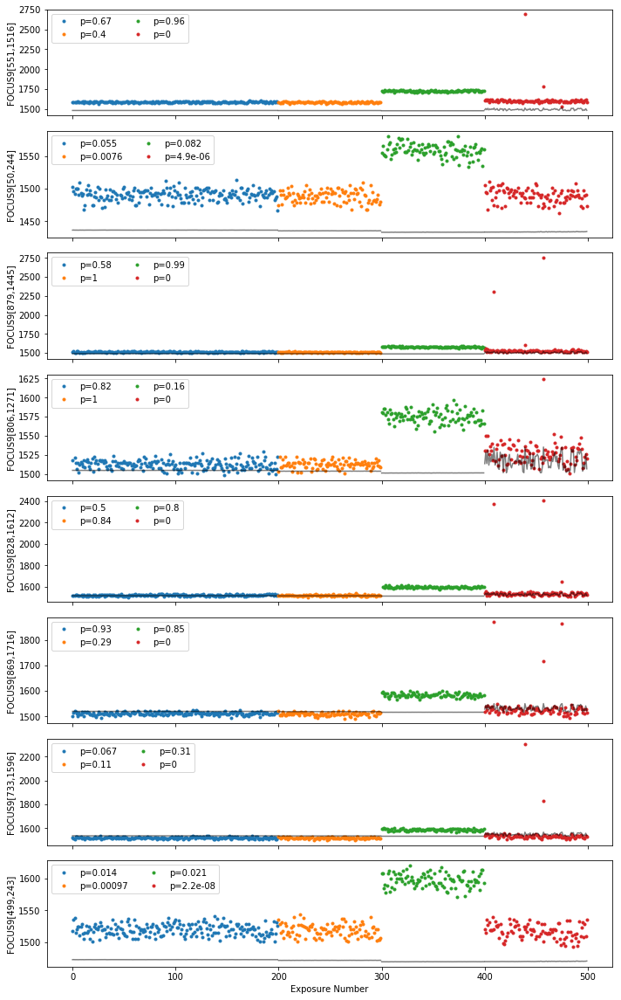

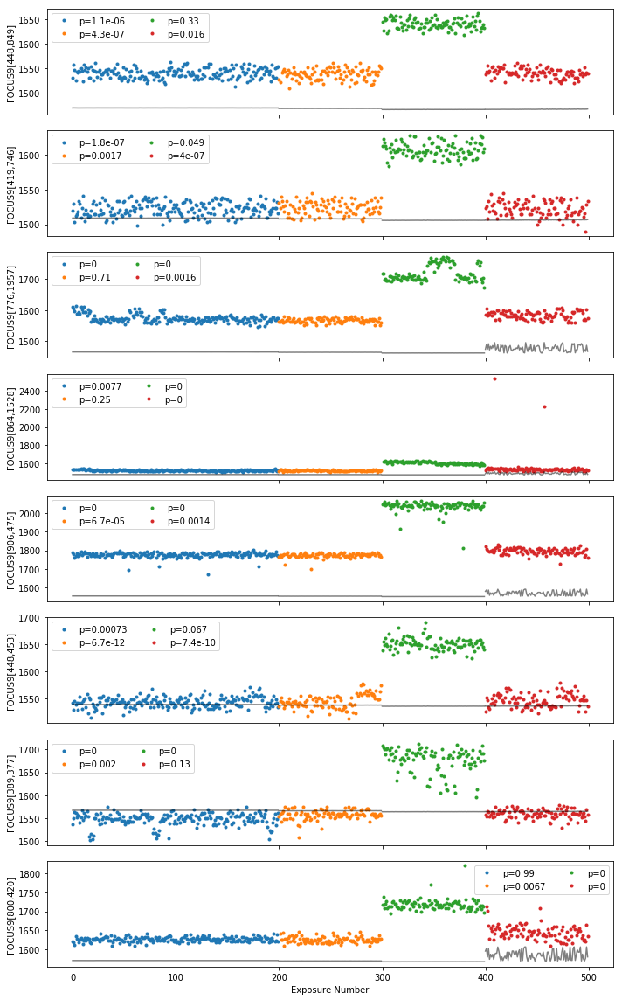

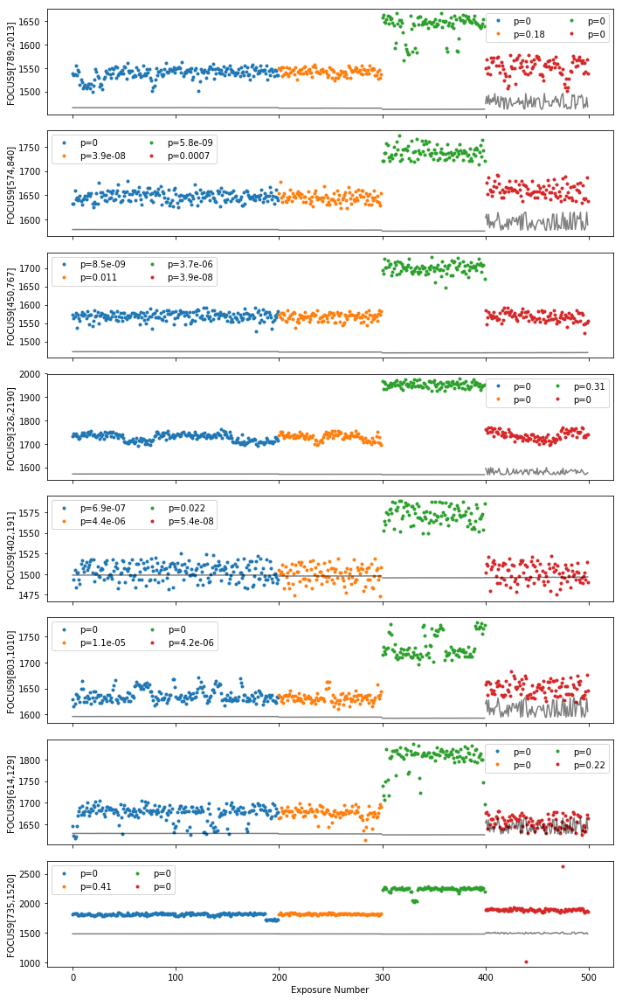

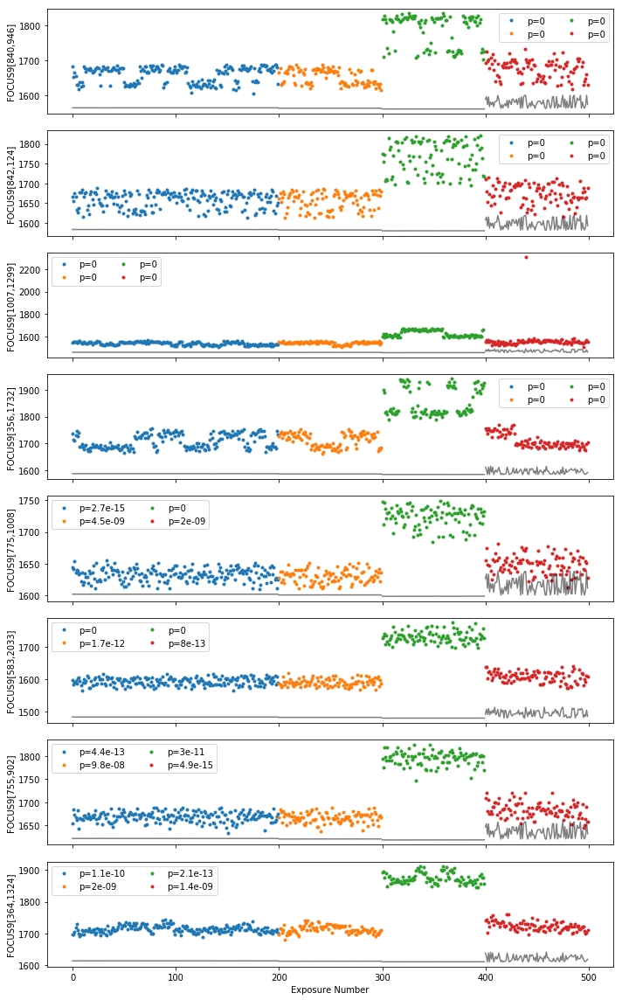

In [43]:
for gfa in desietcimg.gfa.GFACamera.gfa_names:
    for n in range(5):
        plot_timeseries(gfa, nbadseq=n, save=str(plotdir / '{0}_timeseries_{1}.png'.format(gfa, n)))
        plt.show()

## Build Final Pixel Mask

In [42]:
def create_mask(minbadseq=2, pcut=1e-5):
    mask = {}
    ny, nx = 2 * 516, 2 * 1024    
    nseq = len(maskinfo)
    for gfa in desietcimg.gfa.GFACamera.gfa_names: 
        count = np.zeros((ny, nx))
        for first, data in maskinfo.items():
            count += data['pvalue'][gfa] < pcut
        mask[gfa] = count >= minbadseq
        nmask = np.count_nonzero(mask[gfa])
        print('{0}: masked {1:.3f}% pixels.'.format(gfa, 100 * nmask / (ny * nx)))
    return mask

pixel_mask = create_mask()

GUIDE0: masked 0.385% pixels.
FOCUS1: masked 0.920% pixels.
GUIDE2: masked 0.158% pixels.
GUIDE3: masked 0.119% pixels.
FOCUS4: masked 0.036% pixels.
GUIDE5: masked 0.020% pixels.
FOCUS6: masked 0.621% pixels.
GUIDE7: masked 0.315% pixels.
GUIDE8: masked 1.414% pixels.
FOCUS9: masked 0.741% pixels.


## Save Updated Calibrations

In [107]:
desietcimg.gfa.save_calib_data('GFA_calib_mask.fits', pixel_mask=pixel_mask)

Using default master_zero
Using default master_dark
Using default readnoise
Using default gain
Using default tempfit
Saved GFA calib data to GFA_calib_mask.fits.


Use this for subsequent flat and dark calibrations:

In [108]:
!cp GFA_calib_mask.fits {CALIB}